<a href="https://colab.research.google.com/github/brbi1248/LunarLander_AI_ReinforcementLearning/blob/main/RL_LunarLander.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Reinforcement Learning Using the Lunar Landing Environment**
Author: Brittany Bilotti

Github:

References:
Stable Baselines3 PPO Documentation:

- Title: Stable Baselines3 PPO Documentation
- URL: https://stable-baselines3.readthedocs.io/en/master/modules/ppo.html

Neuromatch Academy - Reinforcement Learning Project: Lunar Lander:

- Title: Neuromatch Academy - Reinforcement Learning Project: Lunar Lander
- URL:https://deeplearning.neuromatch.io/projects/ReinforcementLearning/lunar_lander.html

## Project Overview, Environment, and Game Rules

This project revolves around testing and comparing various reinforcement learning techniques—DQN (Deep Q-Network), A2C (Advantage Actor-Critic), and PPO (Proximal Policy Optimization)—using the Lunar Lander environment available in the Stable Baselines library. The primary aim is to assess and contrast the performance of these algorithms within the Lunar Lander environment to determine their effectiveness and suitability for solving the control problem posed by the Lunar Lander game.

In the Lunar Lander environment, the goal is to maneuver a spacecraft to land safely on a designated landing pad. The spacecraft needs to control its orientation and thrusters to navigate through a gravity-based environment while avoiding obstacles. The spacecraft has discrete actions available, such as firing the main engine or directional thrusters, influencing its position and speed. The objective is to land the spacecraft safely within a designated area, factoring in fuel consumption and avoiding crashes to achieve maximum rewards.

# **RUN THIS**

In [39]:
!pip install stable-baselines3[extra]
!apt-get install swig cmake libopenmpi-dev zlib1g-dev
!pip install box2d-py==2.3.8

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libopenmpi-dev is already the newest version (4.1.2-2ubuntu1).
swig is already the newest version (4.0.2-1ubuntu1).
cmake is already the newest version (3.22.1-1ubuntu1.22.04.1).
zlib1g-dev is already the newest version (1:1.2.11.dfsg-2ubuntu9.2).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.


In [40]:
import gym
from stable_baselines3.common.vec_env import VecNormalize
from stable_baselines3 import DQN
from stable_baselines3 import PPO
from stable_baselines3 import A2C
import gymnasium as gym
from stable_baselines3.common.evaluation import evaluate_policy
import matplotlib.pyplot as plt
import imageio
import numpy as np
from stable_baselines3 import A2C
import warnings
warnings.filterwarnings("ignore", category=UserWarning, message="")
from stable_baselines3.common.env_util import make_vec_env
from stable_baselines3.common.callbacks import EvalCallback
import torch
import base64
import os
from stable_baselines3.common.results_plotter import ts2xy, load_results
from stable_baselines3.common.env_util import make_atari_env
from gym import spaces
from gym.wrappers.monitoring.video_recorder import VideoRecorder
from stable_baselines3.common.monitor import Monitor
from IPython.display import Image, display

In [41]:
from google.colab import drive
drive.mount('/content/drive')
drive_path = '/content/drive/My Drive/'
save_dir = os.path.join(drive_path, 'models')
os.makedirs(save_dir, exist_ok=True)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [42]:
#log directory
log_dir = "/tmp/gym/"
os.makedirs(log_dir, exist_ok=True)

In [43]:
#creates a video of the lunar lander after training
def model_gif(model, filename, max_steps=500):
    images = []
    obs = model.env.reset()
    img = model.env.render(mode="rgb_array")
    images.append(img)

    for i in range(max_steps):
        action, _ = model.predict(obs)
        obs, _, done, _ = model.env.step(action)
        img = model.env.render(mode="rgb_array")
        images.append(img)
        if done:
            break

    imageio.mimsave(filename, [np.array(img) for i, img in enumerate(images) ], fps=29)

## **DO NOT RUN PAST HERE UNLESS YOU WANT TO DO SEVERAL HOURS OF RETRAINING, RUN AT BOTTOM WHERE DIRECTED**##

## Model Choices, Methods and Purpose of Tests and Experiments

I used DQN, A2C, and PPO models to see how they handle the Lunar Lander game. By adjusting hyperparameters as needed, like tweaking learning rates or network structures, I tried to improve their performance. I chose DQN because it learns from memory using the buffer hyperparameter. A2C showed promise because it learns from the current policy's experiences and updates the policy continuously, finding a balance between exploring and exploiting. PPO also grabbed my attention because it combines ideas from A2C (having multiple workers) and TRPO (it uses a trust region to improve the actor). The goal was to find which model learned fastest, stayed stable, and discovered the best landing strategies in Lunar Lander.

## Deep Q Network (DQN)
I started by observing DQN's performance on Lunar Lander with default parameters, monitoring its progress without specific optimizations. The environment was logged using a Monitor. Evaluation was scheduled at 10,000-timestep intervals, rendering deterministic results. The DQN model was trained for 100,000 timesteps, the results logged for analysis, and the trained agent saved. The plot showcases the training progress, mapping episode rewards against timesteps.

In [ ]:
log_dir = "/tmp/gym/"

#create environment and wrap it with monitor
env = gym.make("LunarLander-v2", render_mode="rgb_array")
env = Monitor(env, log_dir)

#callback for evaluation and logging
eval_callback = EvalCallback(env, log_path=log_dir, eval_freq=10000, n_eval_episodes=10, deterministic=True, render=False)

#create DQN model
dqn_model = DQN("MlpPolicy", env, verbose=0)

#train the agent
dqn_model.learn(total_timesteps=int(1e5), progress_bar=False, callback=eval_callback)

#save the agent
save_path = os.path.join(save_dir, 'dqn1')
dqn_model.save(save_path)


#evaluate trained model
mean_reward, std_reward = evaluate_policy(dqn_model, env, n_eval_episodes=10)
print(f"Mean reward over 10 evaluation episodes: {mean_reward:.2f}")


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Eval num_timesteps=10000, episode_reward=-96.43 +/- 76.31
Episode length: 91.40 +/- 50.15
New best mean reward!
Eval num_timesteps=20000, episode_reward=-108.04 +/- 33.90
Episode length: 84.10 +/- 11.18
Eval num_timesteps=30000, episode_reward=-92.92 +/- 103.27
Episode length: 84.90 +/- 15.90
New best mean reward!
Eval num_timesteps=40000, episode_reward=-82.49 +/- 67.98
Episode length: 171.40 +/- 276.47
New best mean reward!
Eval num_timesteps=50000, episode_reward=-89.13 +/- 104.41
Episode length: 130.10 +/- 152.07
Eval num_timesteps=60000, episode_reward=-199.83 +/- 80.16
Episode length: 545.10 +/- 373.21
Eval num_timesteps=70000, episode_reward=-61.90 +/- 96.41
Episode length: 642.90 +/- 372.38
New best mean reward!
Eval num_timesteps=80000, episode_reward=-214.38 +/- 136.81
Episode length: 748.50 +/- 384.21
Eval num_timesteps=90000, episode_reward=-134.74 +/- 72.05
Episode length: 755.60 +/- 373.44
Eval num_timesteps=100000, episode_reward=-366.59 +/- 100.85
Episode length: 560.70

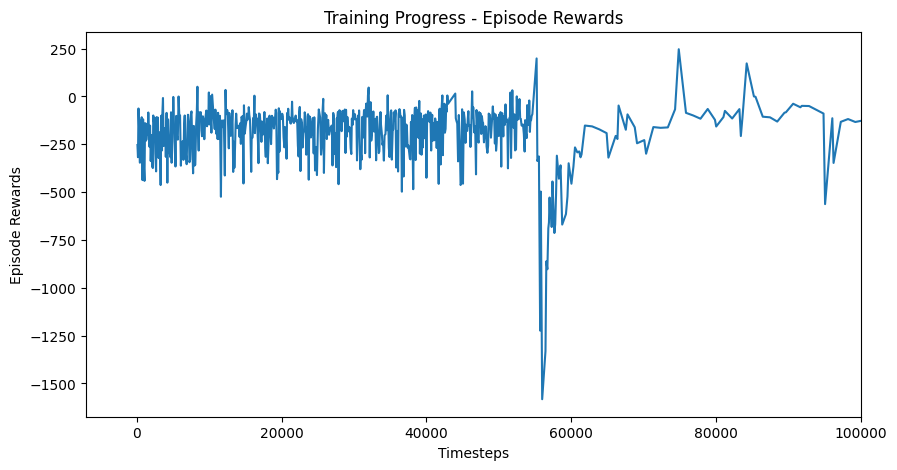

In [ ]:
#load the results and organize them for plotting
x, y = ts2xy(load_results(log_dir), 'timesteps')

#plotting
plt.figure(figsize=(10, 5))
plt.plot(x, y)
plt.xlabel('Timesteps')
plt.ylabel('Episode Rewards')
plt.title('Training Progress - Episode Rewards')
#limit x-axis to 100,000 timesteps
plt.xlim(right=100000)
plt.show()

In [ ]:
#Load the model
loaded_dqn_model = DQN.load('/content/drive/My Drive/models/dqn1.zip', env = env)

In [ ]:
from IPython.display import Image, display
model_gif(loaded_dqn_model, 'dqn_1.gif')
#path to gif file
gif_path_dqn = 'dqn_1.gif'


/usr/local/lib/python3.10/dist-packages/imageio/plugins/pillow.py:390: DeprecationWarning: The keyword `fps` is no longer supported. Use `duration`(in ms) instead, e.g. `fps=50` == `duration=20` (1000 * 1/50).
  warnings.warn(


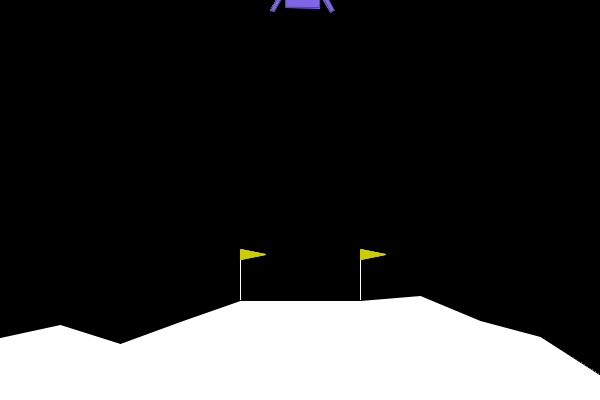

In [ ]:
#display gif file
Image(open(gif_path_dqn, 'rb').read())

## Results of DQN without hyperparameter optimization
The agent's performance in the Lunar Lander environment remains consistently challenging, displaying negative rewards throughout the evaluation process. While some fluctuations are observed, there's limited improvement over time in the agent's learned strategies for navigation, as evident from the persistently low rewards and relatively unchanged episode lengths. However, there are moments of progress, notably at steps 60000 and 70000, where I witnessed spikes in rewards and considerable changes in episode lengths. Yet, these positive deviations were not sustained, and the overall trend shows that I need to further refine my model to achieve more consistent and higher rewards.

## Tuning DQN Model

To make the DQN model perform better, I had to tweak the model's hyperparameter settings to find the best combination and configured an evaluation callback to collect data from 10 episodes for later analysis. To define my policy, I opted for a neural network architecture with two deep layers, each consisting of 256 neurons, enhancing the model's ability to understand complex environment patterns.

In the training phase, I selected hyperparameters to guide the learning process. A smaller learning rate (0.0005) was chosen for stability, while a batch size of 128 helped reduce noise in the learning process. Storing 50,000 experiences in the replay buffer allowed the model to learn from a diverse set of experiences. The learning process commenced from the very beginning (learning start at zero).

The gamma value of 0.99 emphasized long-term rewards, and I trained the network at every step. Target network weights were updated at intervals of 500 steps to balance stability and learning speed. The exploration fraction parameter controlled the reduction in exploration over training timesteps.

Maintaining stability during training was crucial. Therefore, I set a maximum gradient norm of 10 to prevent excessive updates. I encouraged substantial exploration initially (exploration_initial_eps = 1.0) and gradually shifted to exploitation (exploration_final_eps = 0.1) as the model learned.

The total training timesteps were set to 200,000. After training, I evaluated the model's performance over 10 episodes and saved the trained agent for future use.








In [ ]:
#create environment
env = gym.make("LunarLander-v2", render_mode="rgb_array")
env = Monitor(env, log_dir)
#collects data from 10 episodes
eval_callback = EvalCallback(eval_env=env, log_path=log_dir, eval_freq=10000, n_eval_episodes=10, deterministic=True)
#neural network with two deep layers with 256 neurons
policy_kwargs =  dict(activation_fn=torch.nn.ReLU,
                     net_arch=[256, 256])

dqn_model2 =DQN("MlpPolicy", env,policy_kwargs = policy_kwargs,
            learning_rate=0.0005, #smaller learning rate more stable
            batch_size=128,  #samples batch of experiences from buffer, larger batches reduce noise
            buffer_size=50000,  #stores agent's past experiences, larger helps learn more diverse set of experiences
            learning_starts=0,  #start learning right away
            gamma=0.99,  #values long term rewards
            train_freq=(1,"step"),  # train the network at every step.
            target_update_interval = 250, #frequency of updating the target network weights,strikes a balance between stability and learning speed
            exploration_fraction = 0.1,  #fraction of total training timesteps to decay from initial to final exploration
            max_grad_norm = 10,#the maximum value for the gradient clipping, prevents large updates and keeps stability
            exploration_initial_eps=1.0, #have model explore a lot initially
            exploration_final_eps=0.1, #decrease the final exploration so model uses exploitation
            verbose=0)
dqn_model2.learn(total_timesteps=int(1e5), progress_bar=False,  callback=eval_callback)

#evaluate trained model
mean_reward, std_reward = evaluate_policy(dqn_model2, env, n_eval_episodes=10)
print(f"Mean reward over 10 evaluation episodes: {mean_reward:.2f}")

#save the trained agent
save_path = os.path.join(save_dir, 'dqn2')
dqn_model2.save(save_path)


Eval num_timesteps=10000, episode_reward=-198.29 +/- 58.40
Episode length: 513.00 +/- 280.02
New best mean reward!
Eval num_timesteps=20000, episode_reward=-23.88 +/- 38.33
Episode length: 931.10 +/- 206.70
New best mean reward!
Eval num_timesteps=30000, episode_reward=50.01 +/- 85.30
Episode length: 844.70 +/- 241.09
New best mean reward!
Eval num_timesteps=40000, episode_reward=205.29 +/- 99.00
Episode length: 411.20 +/- 319.22
New best mean reward!
Eval num_timesteps=50000, episode_reward=107.58 +/- 52.91
Episode length: 916.90 +/- 178.48
Eval num_timesteps=60000, episode_reward=97.88 +/- 99.04
Episode length: 790.10 +/- 243.49
Eval num_timesteps=70000, episode_reward=166.11 +/- 158.14
Episode length: 457.40 +/- 356.80
Eval num_timesteps=80000, episode_reward=266.36 +/- 20.43
Episode length: 243.70 +/- 61.43
New best mean reward!
Eval num_timesteps=90000, episode_reward=-60.87 +/- 314.96
Episode length: 492.10 +/- 416.12
Eval num_timesteps=100000, episode_reward=190.25 +/- 83.53
Epi

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


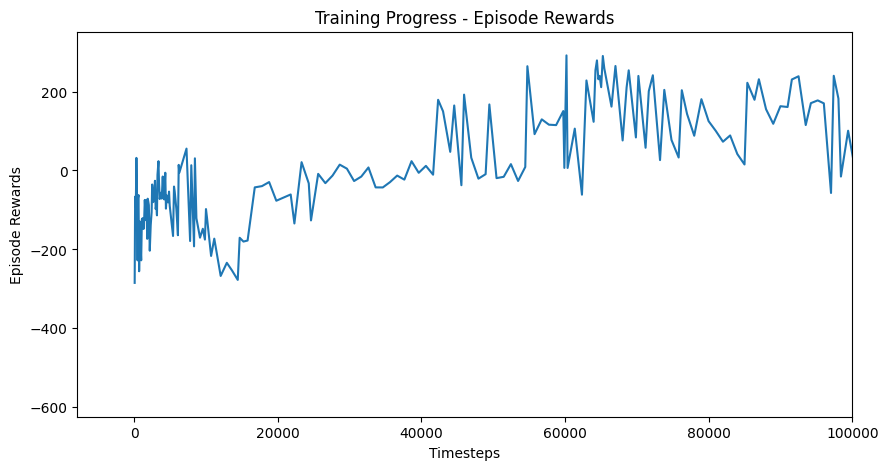

In [ ]:
#load the results and organize them for plotting
x, y = ts2xy(load_results(log_dir), 'timesteps')

#plotting
plt.figure(figsize=(10, 5))
plt.plot(x, y)
plt.xlabel('Timesteps')
plt.ylabel('Episode Rewards')
plt.title('Training Progress - Episode Rewards')
#limit x-axis to 100,000 timesteps
plt.xlim(right=100000)
plt.show()

In [ ]:
#Load the model
loaded_dqn2_model = DQN.load('/content/drive/My Drive/models/dqn2.zip', env = env)

In [ ]:
model_gif(loaded_dqn2_model, 'dqn_2.gif')
#path to gif file
gif_path_dqn2 = 'dqn_2.gif'



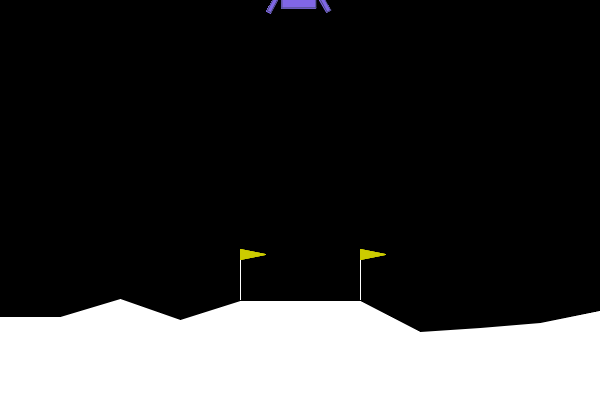

In [ ]:
#display gif file
Image(open(gif_path_dqn2, 'rb').read())

## Results of DQN with hyperparameter optimization
After fine-tuning the hyperparameters for the DQN model in the Lunar Lander environment, the improvements were quite substantial compared to my initial, non-optimized DQN model. With hyperparameter optimization, the mean reward soared to an impressive 173.43 over 10 evaluation episodes, a marked improvement from the earlier model. This optimization significantly enhanced the model's ability to understand the environment, leading to more effective navigation strategies. I observed a consistent increase in rewards as the model learned, surpassing the limitations of the non-optimized version. Moreover, the tuned model displayed improved stability and better handling of long-term dependencies, as evidenced by the stable episode lengths across evaluation steps. Overall, this hyperparameter optimization strategy notably boosted the model's performance, presenting a more refined and adept agent in tackling the Lunar Lander challenge.

## Asynchronous Advantage Actor Critic (A2C)

I started by observing Asynchronous Advantage Actor Critic's performance on Lunar Lander with default parameters, monitoring its progress without specific optimizations. The environment was logged using a Monitor. Evaluation was scheduled at 10000-timestep intervals, rendering deterministic results. The A2C model was trained for 100,000 timesteps, the results logged for analysis, and the trained agent saved. The plot showcases the training progress, mapping episode rewards against timesteps.

In [ ]:
#create environment and wrap it with monitor
env = gym.make("LunarLander-v2", render_mode="rgb_array")
env = Monitor(env, log_dir)


#callback for evaluation and logging
eval_callback = EvalCallback(env, log_path=log_dir, eval_freq=10000, n_eval_episodes=10, deterministic=True, render=False)

#create A2C agent
a2c_model = A2C("MlpPolicy", env, verbose=0)

#train the agent
a2c_model.learn(total_timesteps=int(1e5), progress_bar=False, callback=eval_callback)

#save the agent
a2c_save_path = os.path.join(save_dir, 'a2c1')
a2c_model.save(a2c_save_path)

#evaluate trained model
mean_reward, std_reward = evaluate_policy(a2c_model, env, n_eval_episodes=10)
print(f"Mean reward over 10 evaluation episodes: {mean_reward:.2f}")


Eval num_timesteps=10000, episode_reward=-606.40 +/- 429.46
Episode length: 999.10 +/- 2.70
New best mean reward!
Eval num_timesteps=20000, episode_reward=-95.01 +/- 209.73
Episode length: 616.10 +/- 331.57
New best mean reward!
Eval num_timesteps=30000, episode_reward=-415.76 +/- 419.75
Episode length: 581.00 +/- 206.37
Eval num_timesteps=40000, episode_reward=-226.16 +/- 259.27
Episode length: 617.40 +/- 223.24
Eval num_timesteps=50000, episode_reward=-119.19 +/- 191.81
Episode length: 769.80 +/- 279.43
Eval num_timesteps=60000, episode_reward=122.24 +/- 72.88
Episode length: 537.50 +/- 382.34
New best mean reward!
Eval num_timesteps=70000, episode_reward=20.06 +/- 143.87
Episode length: 318.20 +/- 200.89
Eval num_timesteps=80000, episode_reward=132.59 +/- 92.21
Episode length: 491.30 +/- 210.42
New best mean reward!
Eval num_timesteps=90000, episode_reward=-24.88 +/- 122.70
Episode length: 374.60 +/- 64.24
Eval num_timesteps=100000, episode_reward=-127.20 +/- 33.75
Episode length: 1

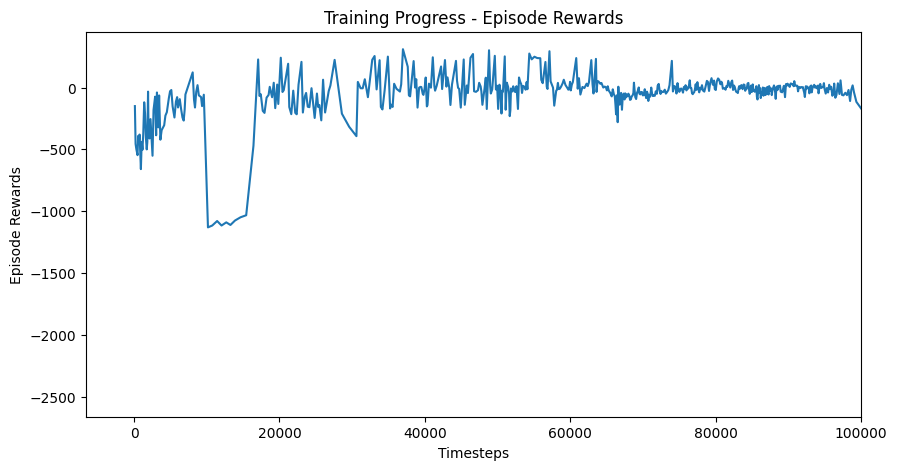

In [ ]:
#load the results and organize them for plotting
x, y = ts2xy(load_results(log_dir), 'timesteps')

#plotting
plt.figure(figsize=(10, 5))
plt.plot(x, y)
plt.xlabel('Timesteps')
plt.ylabel('Episode Rewards')
plt.title('Training Progress - Episode Rewards')
#limit x-axis to 100,000 timesteps
plt.xlim(right=100000)
plt.show()

In [ ]:
#Load the model
loaded_a2c_model = A2C.load('/content/drive/My Drive/models/a2c1.zip', env = env)

In [ ]:
model_gif(loaded_a2c_model, 'a2c_1.gif')
#path to gif file
gif_path_a2c = 'a2c_1.gif'


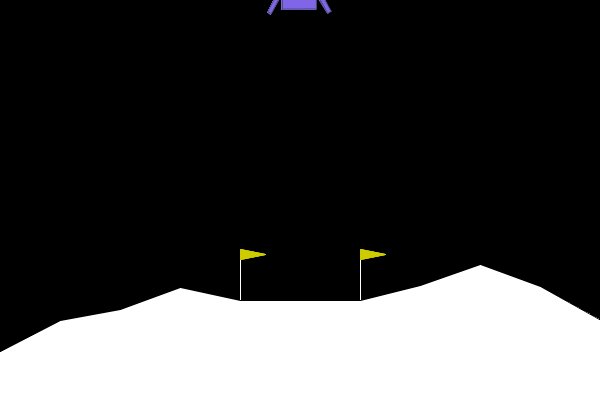

In [ ]:
#display gif file
Image(open(gif_path_a2c, 'rb').read())

## Results of A2C without hyperparameter optimization
The evaluation results for my initial A2C model without hyperparameter optimization were quite challenging. Initially, the model struggled significantly, showing inconsistent performance with notably poor rewards and unstable episode lengths. There were moments of progress around steps 60000 to 80000, where I observed increased rewards and reduced episode lengths, marking significant improvements. However, the subsequent evaluations showed fluctuations and inconsistencies, highlighting the need for further fine-tuning to attain stable and consistently higher rewards. The mean reward over 10 evaluation episodes hovered around -128.12, reflecting the overall difficulty of training the A2C model without optimizing its hyperparameters.

## Tuning A2C Model
To refine the performance of my A2C model, I started with parameter values that were in the middle and adjusted each until I found the perfect combination to achieve the best performance. The neural network architecture was constructed with two deep layers, each containing 256 neurons, enhancing the model's capacity to comprehend somplicated environmental patterns.

Setting the gamma value to 0.9995 underscored the model's emphasis on future rewards, prioritizing long-term outcomes. To strike a delicate balance in learning, I adjusted the learning rate to 0.0008, mindful that excessively high rates could lead to overshooting while excessively low rates might hinder the learning pace. The parameter n_steps, designated at 10, determined the number of steps executed for each update which helped helped increase performance significantly when increased. Encouraging exploration in the policy space, I set the ent_coef to 0.00001, penalizing overconfident policies to foster continued exploration during training. These adjustments were pivotal in fine-tuning the A2C model, enhancing its adaptability and learning capabilities in complex environments.

In [ ]:
#create environment and wrap it with monitor
env = gym.make("LunarLander-v2", render_mode="rgb_array")
env = Monitor(env, log_dir)


#callback for evaluation and logging
eval_callback = EvalCallback(env, log_path=log_dir, eval_freq=10000, n_eval_episodes=10, deterministic=True, render=False)
#neural network with two deep layers with 256 neurons
policy_kwargs =  dict(activation_fn=torch.nn.ReLU,
                     net_arch=[256, 256])

a2c_model2 = A2C("MlpPolicy", env, policy_kwargs = policy_kwargs,
                 gamma = 0.9995,
                 learning_rate= 0.0008, #too high might cause overshooting, too low may slow down learning
                 n_steps=10,  #number of steps to run for each update
                 ent_coef=0.00001,#encourages exploration by penalizing too confident policies where non-zero value promotes exploration
                 verbose=0)
#train the agent
a2c_model2.learn(total_timesteps=int(1e5), progress_bar=False, callback=eval_callback)
#save the agent
a2c2_save_path = os.path.join(save_dir, 'a2c2')
a2c_model2.save(a2c2_save_path)


#evaluate trained model
mean_reward, std_reward = evaluate_policy(a2c_model2, env, n_eval_episodes=10)
print(f"Mean reward over 10 evaluation episodes: {mean_reward:.2f}")

Eval num_timesteps=10000, episode_reward=-112.78 +/- 66.48
Episode length: 815.00 +/- 248.62
New best mean reward!
Eval num_timesteps=20000, episode_reward=-20.43 +/- 20.15
Episode length: 1000.00 +/- 0.00
New best mean reward!
Eval num_timesteps=30000, episode_reward=-166.04 +/- 19.86
Episode length: 237.40 +/- 66.87
Eval num_timesteps=40000, episode_reward=105.36 +/- 136.30
Episode length: 394.10 +/- 161.46
New best mean reward!
Eval num_timesteps=50000, episode_reward=42.97 +/- 135.89
Episode length: 359.90 +/- 52.22
Eval num_timesteps=60000, episode_reward=-208.68 +/- 30.81
Episode length: 917.70 +/- 151.54
Eval num_timesteps=70000, episode_reward=-154.89 +/- 29.75
Episode length: 1000.00 +/- 0.00
Eval num_timesteps=80000, episode_reward=35.25 +/- 133.08
Episode length: 398.40 +/- 65.96
Eval num_timesteps=90000, episode_reward=-108.75 +/- 13.19
Episode length: 269.20 +/- 101.75
Eval num_timesteps=100000, episode_reward=130.29 +/- 117.85
Episode length: 514.90 +/- 164.53
New best me

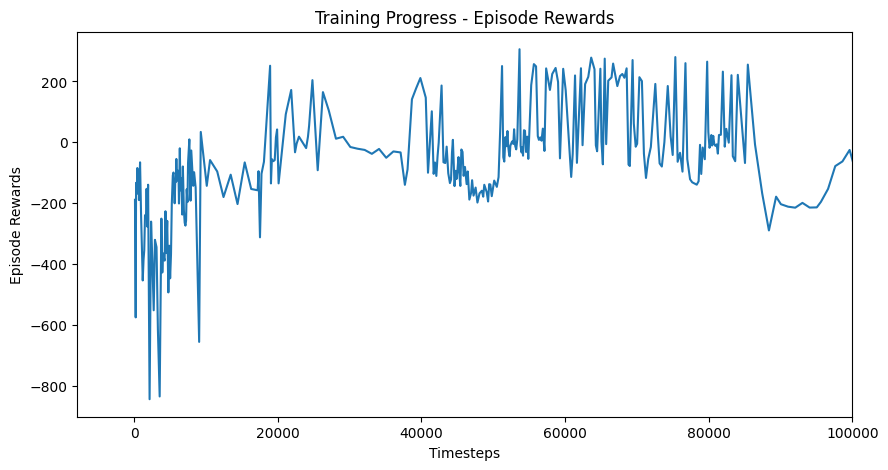

In [ ]:
#load the results and organize them for plotting
x, y = ts2xy(load_results(log_dir), 'timesteps')

#plotting
plt.figure(figsize=(10, 5))
plt.plot(x, y)
plt.xlabel('Timesteps')
plt.ylabel('Episode Rewards')
plt.title('Training Progress - Episode Rewards')
#limit x-axis to 100,000 timesteps
plt.xlim(right=100000)
plt.show()

In [ ]:
loaded_a2c2_model = A2C.load('/content/drive/My Drive/models/a2c2.zip', env = env)

In [ ]:
model_gif(loaded_a2c2_model, 'a2c_2.gif')
#path to gif file
gif_path_a2c2 = 'a2c_2.gif'


/usr/local/lib/python3.10/dist-packages/imageio/plugins/pillow.py:390: DeprecationWarning: The keyword `fps` is no longer supported. Use `duration`(in ms) instead, e.g. `fps=50` == `duration=20` (1000 * 1/50).
  warnings.warn(


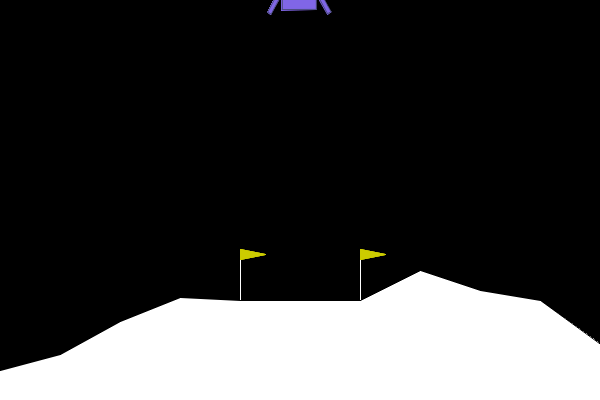

In [ ]:
#display gif file
Image(open(gif_path_a2c2, 'rb').read())

## Results of A2C with hyperparameter optimization
Initially, the model exhibited erratic behaviors, showing negative rewards and diverse episode lengths. As the training progressed, particularly beyond the 40,000 mark, the model started to improve. Episodes showcased improved rewards and more consistent episode lengths, signifying an improved learning curve. By the 100,000th timestep, the model displayed better progress than its predecessor, showcasing positive rewards with more predictable and moderate episode lengths. The mean reward over 10 evaluation episodes reached 147.13, underscoring the model's strengthened learning and strategic decision-making capabilities.

## Proximal Policy Optimization (PPO)
Like the other two models, I started by observing the PPO's performance on Lunar Lander with default parameters and trained for 10,000 timesteps to see how it performed as a baseline before hyperparamter optimization.

In [ ]:
#create environment and wrap it with monitor
env = gym.make("LunarLander-v2", render_mode="rgb_array")
env = Monitor(env, log_dir)


#callback for evaluation and logging
eval_callback = EvalCallback(env, log_path=log_dir, eval_freq=10000, n_eval_episodes=10, deterministic=True, render=False)

#create ppo agent
ppo_model = PPO("MlpPolicy", env, verbose=0)

#train the agent
ppo_model.learn(total_timesteps=int(1e5), progress_bar=False, callback=eval_callback)

#save the agent
ppo_save_path = os.path.join(save_dir, 'ppo1')
ppo_model.save(ppo_save_path)

#evaluate trained model
mean_reward, std_reward = evaluate_policy(ppo_model, env, n_eval_episodes=10)
print(f"Mean reward over 10 evaluation episodes: {mean_reward:.2f}")


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Eval num_timesteps=10000, episode_reward=-452.95 +/- 249.41
Episode length: 417.20 +/- 315.97
New best mean reward!
Eval num_timesteps=20000, episode_reward=-318.42 +/- 57.03
Episode length: 225.90 +/- 43.90
New best mean reward!
Eval num_timesteps=30000, episode_reward=-613.27 +/- 264.92
Episode length: 473.90 +/- 166.87
Eval num_timesteps=40000, episode_reward=-1077.56 +/- 240.36
Episode length: 479.90 +/- 118.10
Eval num_timesteps=50000, episode_reward=-435.47 +/- 97.01
Episode length: 563.10 +/- 156.14
Eval num_timesteps=60000, episode_reward=-622.98 +/- 168.89
Episode length: 739.70 +/- 51.17
Eval num_timesteps=70000, episode_reward=-558.97 +/- 42.42
Episode length: 1000.00 +/- 0.00
Eval num_timesteps=80000, episode_reward=-278.47 +/- 31.48
Episode length: 986.40 +/- 40.80
New best mean reward!
Eval num_timesteps=90000, episode_reward=-154.10 +/- 73.81
Episode length: 969.60 +/- 53.74
New best mean reward!
Eval num_timesteps=100000, episode_reward=-130.71 +/- 57.52
Episode length:

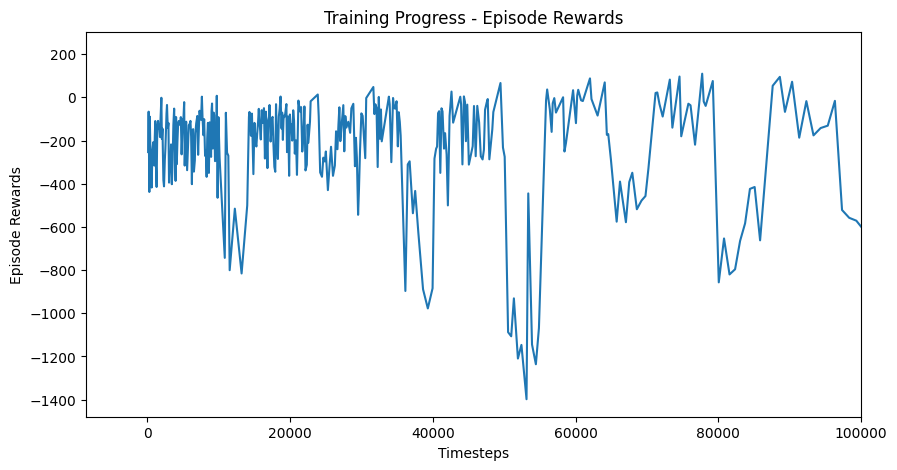

In [ ]:
#load the results and organize them for plotting
x, y = ts2xy(load_results(log_dir), 'timesteps')

#plotting
plt.figure(figsize=(10, 5))
plt.plot(x, y)
plt.xlabel('Timesteps')
plt.ylabel('Episode Rewards')
plt.title('Training Progress - Episode Rewards')
#limit x-axis to 100,000 timesteps
plt.xlim(right=100000)
plt.show()

In [52]:
#Load the model
loaded_ppo_model = PPO.load('/content/drive/My Drive/models/ppo1.zip', env = env)

In [53]:
#save the GIF to your Drive
gif_path_ppo1 = 'ppo_1.gif'
model_gif(loaded_ppo_model , 'ppo_1.gif')



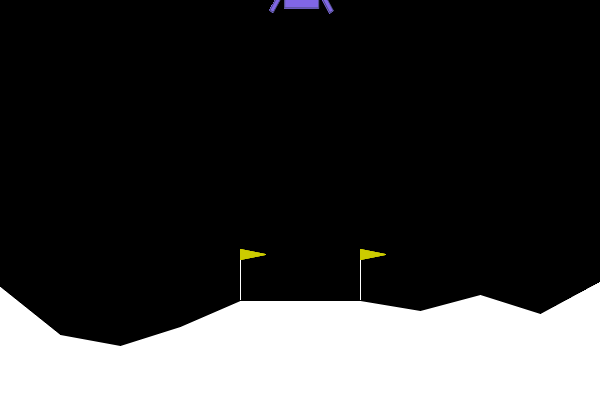

In [54]:
#display gif file
Image(open(gif_path_ppo1, 'rb').read())

## Results of PPO without hyperparameter optimization
The performance of the PPO model showcases variations across different evaluation stages. Initially, there are fluctuations in episode rewards and lengths, with significant improvements observed at specific milestones, notably at 10,000, 20,000, and 80,000 timesteps. These milestones recorded notable advancements in both mean reward and episode length, highlighting key moments of progress. However, beyond 80,000 timesteps, the model exhibits fluctuations in rewards and episode lengths, indicating a potential instability in learned behaviors. Despite occasional peaks, I still need to refine the model to get better results.

## Tuning PPO Model

In [ ]:
#create environment and wrap it with monitor
env = gym.make("LunarLander-v2", render_mode="rgb_array")
env = Monitor(env, log_dir)

#callback for evaluation and logging
eval_callback = EvalCallback(env, log_path=log_dir, eval_freq=10000, n_eval_episodes=10, deterministic=True, render=False)

#create ppo agent
ppo_model2 = PPO("MlpPolicy", env,
                 learning_rate = 0.0008, #lower values stabilize training but slow learning
                 n_steps=1000, #between 128 to 2048, num of steps to collect before performing policy update, higher values can capture more diverse experiences but slow learning
                 batch_size=256, #between 32 and 256, num of samples in one training batch, larger batches more stable gradient estimate but might require more memory
                 gamma=0.99, #long-term rewards, but too high overshooting
                 ent_coef=0.04, #0 and 0.1, encourage exploration, higher values encourage more exploration
                 n_epochs=6, #3-10, more epochs learn more from data but overfitting
                 gae_lambda=0.98, #0.95-1, balances bias-variance in advantage estimation, higher increase bias but decrease variance
                 verbose=0)

#train the agent
ppo_model2.learn(total_timesteps=int(1e5), progress_bar=False, callback=eval_callback)

#save the agent
ppo2_save_path = os.path.join(save_dir, 'ppo2')
ppo_model2.save(ppo2_save_path)

#evaluate trained model
mean_reward, std_reward = evaluate_policy(ppo_model2, env, n_eval_episodes=10)
print(f"Mean reward over 10 evaluation episodes: {mean_reward:.2f}")

Eval num_timesteps=10000, episode_reward=-189.92 +/- 117.71
Episode length: 151.20 +/- 29.50
New best mean reward!
Eval num_timesteps=20000, episode_reward=-1133.93 +/- 341.92
Episode length: 371.20 +/- 30.52
Eval num_timesteps=30000, episode_reward=-533.73 +/- 71.78
Episode length: 890.80 +/- 147.94
Eval num_timesteps=40000, episode_reward=-348.62 +/- 86.90
Episode length: 718.90 +/- 265.71
Eval num_timesteps=50000, episode_reward=-271.22 +/- 72.46
Episode length: 660.70 +/- 210.87
Eval num_timesteps=60000, episode_reward=-163.11 +/- 46.20
Episode length: 367.60 +/- 81.01
New best mean reward!


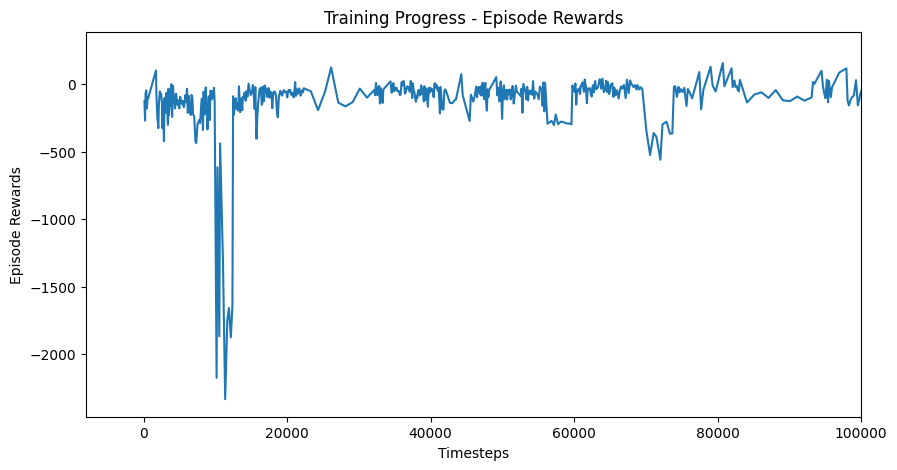

In [ ]:
#load the results and organize them for plotting
x, y = ts2xy(load_results(log_dir), 'timesteps')

#plotting
plt.figure(figsize=(10, 5))
plt.plot(x, y)
plt.xlabel('Timesteps')
plt.ylabel('Episode Rewards')
plt.title('Training Progress - Episode Rewards')
#limit x-axis to 100,000 timesteps
plt.xlim(right=100000)
plt.show()

In [ ]:
#Load the model
loaded_ppo2_model = PPO.load('/content/drive/My Drive/models/ppo2.zip', env = env)

In [ ]:
#save the GIF to your Drive
gif_path_ppo2 = 'ppo_2.gif'
model_gif(loaded_ppo2_model , 'ppo_2.gif')



/usr/local/lib/python3.10/dist-packages/imageio/plugins/pillow.py:390: DeprecationWarning: The keyword `fps` is no longer supported. Use `duration`(in ms) instead, e.g. `fps=50` == `duration=20` (1000 * 1/50).
  warnings.warn(


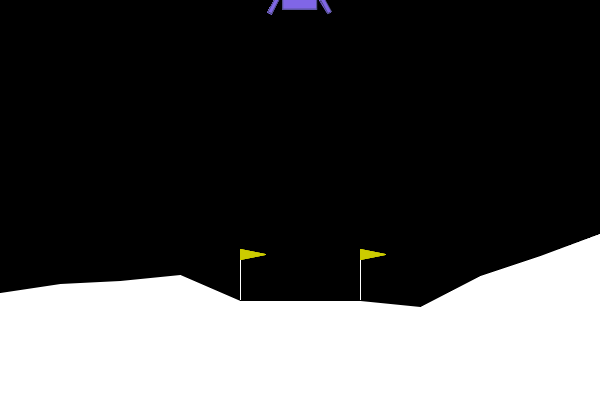

In [ ]:
#display gif file
Image(open(gif_path_ppo2, 'rb').read())

## Troubleshooting and Techniques of Model Experimentation
The process of fine-tuning the DQN model was a meticulous journey, starting from the highest parameter values and gradually adjusting each downward. Key parameters like batch size, buffer size, exploration fraction, target update intervals, and learning rate were pivotal in shaping the model's performance. As for the A2C model, I took a measured step-by-step approach, initially starting with just one parameter and slowly working my way up to three, focusing mainly on learning_rate, n_steps, and an entropy coefficient.
Conversely, the optimization for the PPO model was more strategic, weighing various parameters like learning_rate, n_steps, batch_size, gamma, entropy coefficient, n_epochs, and gae_lambda. I began with intermediate values and methodically adjusted each parameter from top to bottom, finding this approach most efficient in enhancing the model's performance across different training stages.

# Results: Comparing the Models' Performance

## DQN, A2C, PPO Mean Rewards Without Hyperparameter Optimization:

As we can see from the mean reward values below, all three algorithms performed badly without hyperparameter optimization. PPO notably had the best score amongst the three leading me to believe that PPO would be the best algorithm to start experimenting with on the lunar lander agent.

## **START RUNNING AGAIN FROM HERE**
## **DEMO CLIPS TO SEE MODEL PERFORMANCE BELOW**

In [45]:
#Load the models
loaded_dqn_model = DQN.load('/content/drive/My Drive/models/dqn1.zip', env = env)
loaded_a2c_model = A2C.load('/content/drive/My Drive/models/a2c1.zip', env = env)
loaded_ppo_model = PPO.load('/content/drive/My Drive/models/ppo1.zip', env = env)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [55]:
gif_path_dqn = 'dqn_1.gif'
model_gif(loaded_dqn_model, 'dqn_1.gif')

gif_path_a2c = 'a2c_1.gif'
model_gif(loaded_a2c_model, 'a2c_1.gif')

gif_path_ppo1 = 'ppo_1.gif'
model_gif(loaded_ppo_model , 'ppo_1.gif')

In [ ]:
dqn_reward, _ = evaluate_policy(loaded_dqn_model, env, n_eval_episodes=10)
a2c_reward, _ = evaluate_policy(loaded_a2c_model, env, n_eval_episodes=10)
ppo_reward, _ = evaluate_policy(loaded_ppo_model, env, n_eval_episodes=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [47]:
print(f"DQN Mean Reward: {dqn_reward:.2f}")
print(f"A2C Mean Reward: {a2c_reward:.2f}")
print(f"PPO Mean Reward: {ppo_reward:.2f}")

DQN Mean Reward: -292.38
A2C Mean Reward: -116.19
PPO Mean Reward: -74.38


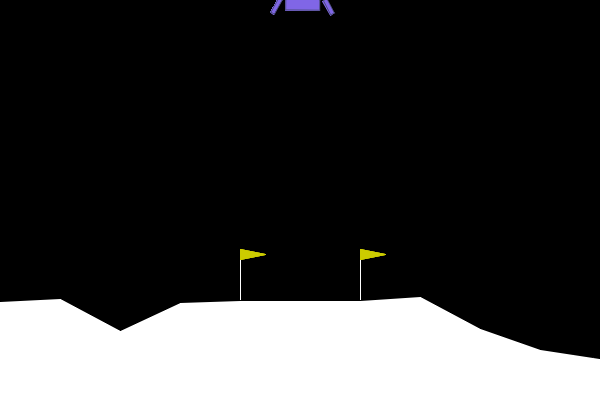

In [56]:
#DQN no hyperparameter optimization demo clip
Image(open(gif_path_dqn, 'rb').read())


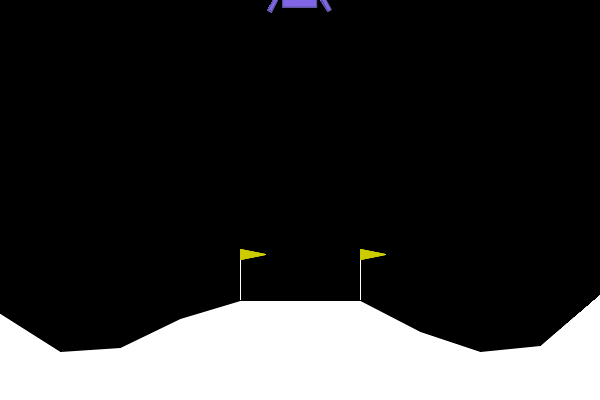

In [57]:
#A2C no hyperparameter optimization demo clip
Image(open(gif_path_a2c, 'rb').read())

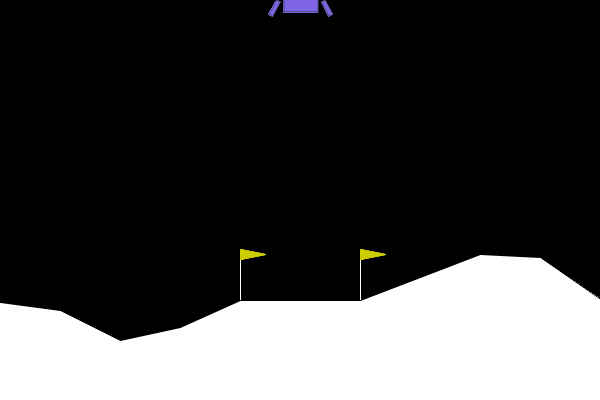

In [58]:
#PPO no hyperparameter optimization demo clip
Image(open(gif_path_ppo1, 'rb').read())

## DQN, A2C, PPO Mean Rewards With Hyperparameter Optimization:

In [ ]:
#Load the models
loaded_dqn2_model = DQN.load('/content/drive/My Drive/models/dqn2.zip', env = env)
loaded_a2c2_model = A2C.load('/content/drive/My Drive/models/a2c2.zip', env = env)
loaded_ppo2_model = PPO.load('/content/drive/My Drive/models/ppo2.zip', env = env)

In [ ]:
gif_path_dqn2 = 'dqn_2.gif'
model_gif(loaded_dqn2_model, 'dqn_2.gif')

gif_path_a2c2 = 'a2c_2.gif'
model_gif(loaded_a2c2_model, 'a2c_2.gif')

gif_path_ppo2 = 'ppo_2.gif'
model_gif(loaded_ppo2_model , 'ppo_2.gif')

In [ ]:
dqn_reward2, _ = evaluate_policy(loaded_dqn2_model, env, n_eval_episodes=10)
a2c_reward2, _ = evaluate_policy(loaded_a2c2_model, env, n_eval_episodes=10)
ppo_reward2, _ = evaluate_policy(loaded_ppo2_model, env, n_eval_episodes=10)

In [ ]:
print(f"Enhanced DQN Mean Reward: {dqn_reward2:.2f}")
print(f"Enhanced A2C Mean Reward: {a2c_reward2:.2f}")
print(f"Enhanced PPO Mean Reward: {ppo_reward2:.2f}")

In [ ]:
#DQN with hyperparameter optimization demo clip
Image(open(gif_path_dqn2, 'rb').read())

In [ ]:
#A2C with hyperparameter optimization demo clip
Image(open(gif_path_a2c2, 'rb').read())

In [ ]:
#PPO with hyperparameter optimization demo clip
Image(open(gif_path_ppo2, 'rb').read())

## Conclusion